# Data Import

Data Source: https://www.kaggle.com/praveengovi/emotions-dataset-for-nlp

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
train_data = pd.read_csv('Data/train.txt', sep=';', names=['text', 'emotion'])
train_data.head()

,text,emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger


In [3]:
test_data = pd.read_csv('Data/test.txt', sep=';', names=['text', 'emotion'])
test_data.head()

,text,emotion
0,im feeling rather rotten so im not very ambiti...,sadness
1,im updating my blog because i feel shitty,sadness
2,i never make her separate from me because i do...,sadness
3,i left with my bouquet of red and yellow tulip...,joy
4,i was feeling a little vain when i did this one,sadness


In [4]:
val_data = pd.read_csv('Data/test.txt', sep=';', names=['text', 'emotion'])
val_data.head()

,text,emotion
0,im feeling rather rotten so im not very ambiti...,sadness
1,im updating my blog because i feel shitty,sadness
2,i never make her separate from me because i do...,sadness
3,i left with my bouquet of red and yellow tulip...,joy
4,i was feeling a little vain when i did this one,sadness


# Basic EDA

1. How much data do I have?

In [5]:
len(train_data), len(test_data), len(val_data)

(16000, 2000, 2000)

2. Does the data have any null values?

In [6]:
if not train_data.isna().sum().any() and not test_data.isna().sum().any():
    print("No Null Values detected")
else:
    print("Null Values detected")

No Null Values detected


3. What is the distribution of 'emotions' in the dataset?

In [7]:
emotions_order = list(train_data.emotion.unique())
emotions_order

['sadness', 'anger', 'love', 'surprise', 'fear', 'joy']

In [8]:
emotions_color = ['blue', 'red', 'pink', 'green', 'grey', 'yellow']

In [9]:
dict_emo_color = {}
for each_emo, each_color in zip(emotions_order, emotions_color):
    dict_emo_color[each_emo] = each_color
    
dict_emo_color

{'sadness': 'blue',
 'anger': 'red',
 'love': 'pink',
 'surprise': 'green',
 'fear': 'grey',
 'joy': 'yellow'}

In [10]:
fig = px.histogram(train_data,
                   x="emotion",
                   template='plotly_white',
                   color='emotion',
                   category_orders = {'emotion': emotions_order}
                  )
fig.update_layout(
    title={
        'text': "Row Count of <b>Train Data</b> by Emotion Tags",
        'x' : 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

In [11]:
fig = px.histogram(test_data,
                   x="emotion",
                   template='plotly_white',
                   color='emotion',
                   category_orders={'emotion': emotions_order})
fig.update_layout(
    title={
        'text': "Row Count of <b>Test Data</b> by Emotion Tags",
        'x': 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

4. What words occur most frequently?

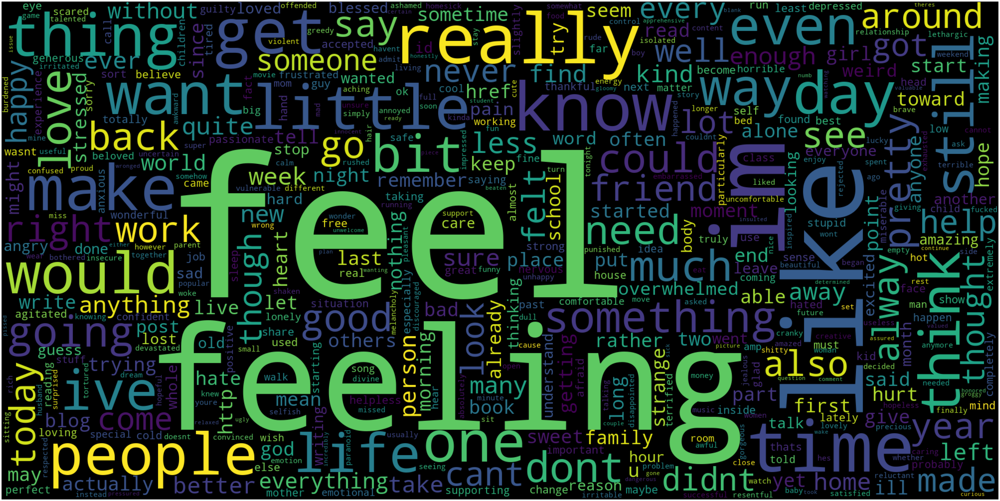

In [12]:
from wordcloud import WordCloud
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))
wordcloud = WordCloud(width=2000,
                      height=1000,
                      max_words=500,
                      normalize_plurals=True,
                      font_step=1,
                      relative_scaling=0.5,
                      collocations=False,
                      stopwords = stop_words,
                      include_numbers=False).generate(" ".join(list(train_data.text)))

plt.figure(figsize = (80, 50), facecolor = None)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

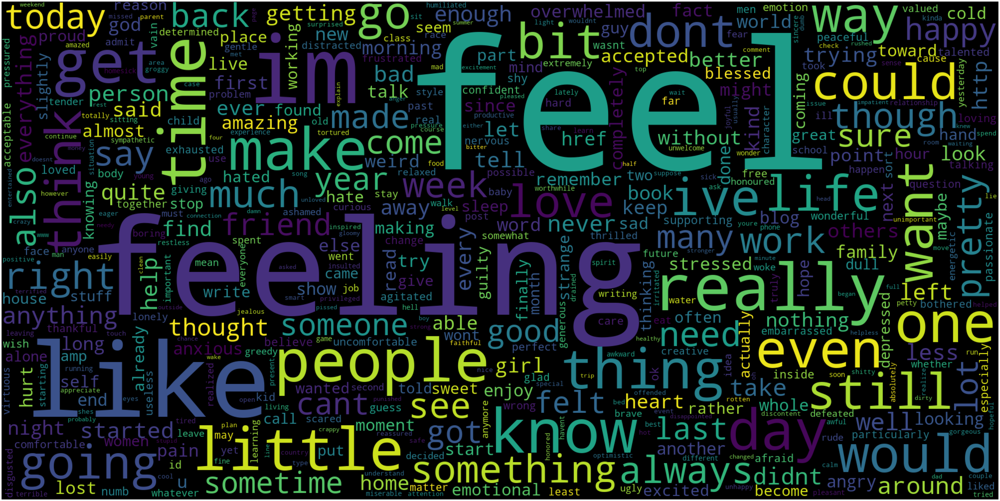

In [13]:
stop_words = set(stopwords.words("english"))
wordcloud = WordCloud(width=2000,
                      height=1000,
                      max_words=500,
                      normalize_plurals=True,
                      font_step=1,
                      relative_scaling=0.5,
                      collocations=False,
                      stopwords = stop_words,
                      include_numbers=False).generate(" ".join(list(test_data.text)))

plt.figure(figsize = (80, 50), facecolor = None)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

5. Length Analysis

In [14]:
train_data['length_text'] = train_data.text.apply(len)
test_data['length_text'] = test_data.text.apply(len)

In [15]:
train_data.head()

,text,emotion,length_text
0,i didnt feel humiliated,sadness,23
1,i can go from feeling so hopeless to so damned...,sadness,108
2,im grabbing a minute to post i feel greedy wrong,anger,48
3,i am ever feeling nostalgic about the fireplac...,love,92
4,i am feeling grouchy,anger,20


In [16]:
fig = px.box(train_data,
             x='emotion',
             y='length_text',
             color='emotion',
             category_orders={'emotion': emotions_order})
fig.show()

In [17]:
fig = px.box(test_data,
             x='emotion',
             y='length_text',
             color='emotion',
             category_orders={'emotion': emotions_order})
fig.show()

6. Sentiment Analysis

In [18]:
from transformers import pipeline
sentiment_analysis_pipeline = pipeline("sentiment-analysis")

C:\Users\nroy0\anaconda3\lib\site-packages\torchaudio\extension\extension.py:13: UserWarning:

torchaudio C++ extension is not available.

C:\Users\nroy0\anaconda3\lib\site-packages\torchaudio\backend\utils.py:89: UserWarning:

No audio backend is available.



In [19]:
train_data['sentiment_hf'] = train_data.text.apply(sentiment_analysis_pipeline)
test_data['sentiment_hf'] = test_data.text.apply(sentiment_analysis_pipeline)

In [20]:
train_data.head()

,text,emotion,length_text,sentiment_hf
0,i didnt feel humiliated,sadness,23,"[{'label': 'POSITIVE', 'score': 0.891336262226..."
1,i can go from feeling so hopeless to so damned...,sadness,108,"[{'label': 'POSITIVE', 'score': 0.966550827026..."
2,im grabbing a minute to post i feel greedy wrong,anger,48,"[{'label': 'NEGATIVE', 'score': 0.999305427074..."
3,i am ever feeling nostalgic about the fireplac...,love,92,"[{'label': 'POSITIVE', 'score': 0.965797126293..."
4,i am feeling grouchy,anger,20,"[{'label': 'NEGATIVE', 'score': 0.999391376972..."


In [21]:
train_data['sentiment_hf'] = train_data['sentiment_hf'].apply(lambda x : x[0]['label'])
test_data['sentiment_hf'] = test_data['sentiment_hf'].apply(lambda x : x[0]['label'])

In [22]:
fig = px.histogram(train_data,
             x="emotion",
             template='plotly_white',
             color='sentiment_hf',
             category_orders={'emotion': emotions_order})
fig.update_layout(
    title={
        'text': "Row Count of <b>Test Data</b> by Emotion Tags",
        'x': 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

# Data Preparation

## Label Encoding

In [27]:
train_data["emotion"] = train_data["emotion"].astype('category')
train_data["emotion_label"] = train_data["emotion"].cat.codes
train_data.head()

,text,emotion,length_text,sentiment_hf,emotion_label
0,i didnt feel humiliated,sadness,23,POSITIVE,4
1,i can go from feeling so hopeless to so damned...,sadness,108,POSITIVE,4
2,im grabbing a minute to post i feel greedy wrong,anger,48,NEGATIVE,0
3,i am ever feeling nostalgic about the fireplac...,love,92,POSITIVE,3
4,i am feeling grouchy,anger,20,NEGATIVE,0


In [28]:
test_data["emotion"] = test_data["emotion"].astype('category')
test_data["emotion_label"] = test_data["emotion"].cat.codes
test_data.head()

,text,emotion,length_text,sentiment_hf,emotion_label
0,im feeling rather rotten so im not very ambiti...,sadness,59,NEGATIVE,4
1,im updating my blog because i feel shitty,sadness,41,NEGATIVE,4
2,i never make her separate from me because i do...,sadness,97,POSITIVE,4
3,i left with my bouquet of red and yellow tulip...,joy,113,POSITIVE,2
4,i was feeling a little vain when i did this one,sadness,47,NEGATIVE,4


## Text Cleaning



In [25]:
import tensorflow as tf

from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Embedding, GlobalAveragePooling1D
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

In [ ]:
batch_size = 1024
seed = 123
train_ds = tf.keras.utils.text_dataset_from_directory('Data/train',
                                                      batch_size=batch_size,
                                                      validation_split=0.2,
                                                      subset='training',
                                                      seed=seed)
val_ds = tf.keras.utils.text_dataset_from_directory('aclImdb/train',
                                                    batch_size=batch_size,
                                                    validation_split=0.2,
                                                    subset='validation',
                                                    seed=seed)